In [1]:
# importing relvant libraries
import math
import matplotlib.pyplot as plt
plt.style.use(['science','ieee'])
plt.rcParams.update({'text.usetex': False})

from ComPhy import *

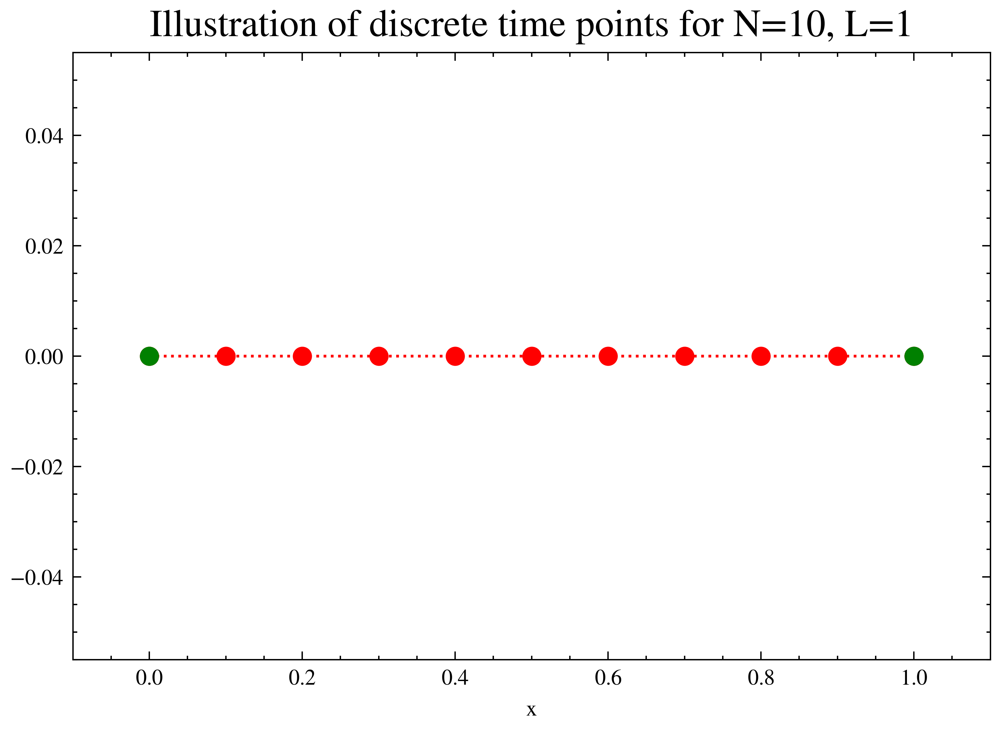

In [2]:
N = 10
a, b = 0, 1
x, h = discretize_axis(N, a, b, plot=True)

### Example Boundary Value Problem
To illustrate the method we will apply the finite difference method to the this boundary value problem
\begin{equation}  \frac{d^2 y}{dx^2} = 4y,\end{equation}
with the boundary conditions
\begin{equation} y(0)=1.1752,  y(1)=10.0179. \end{equation}

To convert the boundary problem into a difference equation we use 1st and 2nd order difference operators.
The general difference equation is
\begin{equation} \frac{1}{h^2}\left(y_{i-1}-2y_i+y_{i+1}\right)=4y_i \ \ \ i=1,..,N-1. \end{equation}

In [3]:
def generate_matrix_A(N, h, v, plot=False):
    """
    Generate the matrix A for a given N and h.

    Args:
    - N: Number of intervals
    - h: Step size
    - plot: Boolean flag to indicate whether to plot the matrix A

    Returns:
    - A: The generated matrix A
    """
    A = [[0] * (N-1) for _ in range(N-1)]
    
    # Diagonal
    for i in range(N-1):
        A[i][i] = -(2 / (h * h) + v)

    # Off-diagonal
    for i in range(N-2):
        A[i+1][i] = 1 / (h * h)
        A[i][i+1] = 1 / (h * h)
    
    if plot:
        plt.figure(figsize=(4,4))
        plt.imshow(A, interpolation='none', cmap='plasma')
        plt.xlabel('i', fontsize=8)
        plt.ylabel('j', fontsize=8)
        #plt.yticks(range(1, N), range(1, N))
        #plt.xticks(range(1, N), range(1, N))
        clb = plt.colorbar()
        clb.set_label('Matrix value')
        plt.title('Matrix A', fontsize=20)
        plt.tight_layout()
        plt.show()
    
    return A

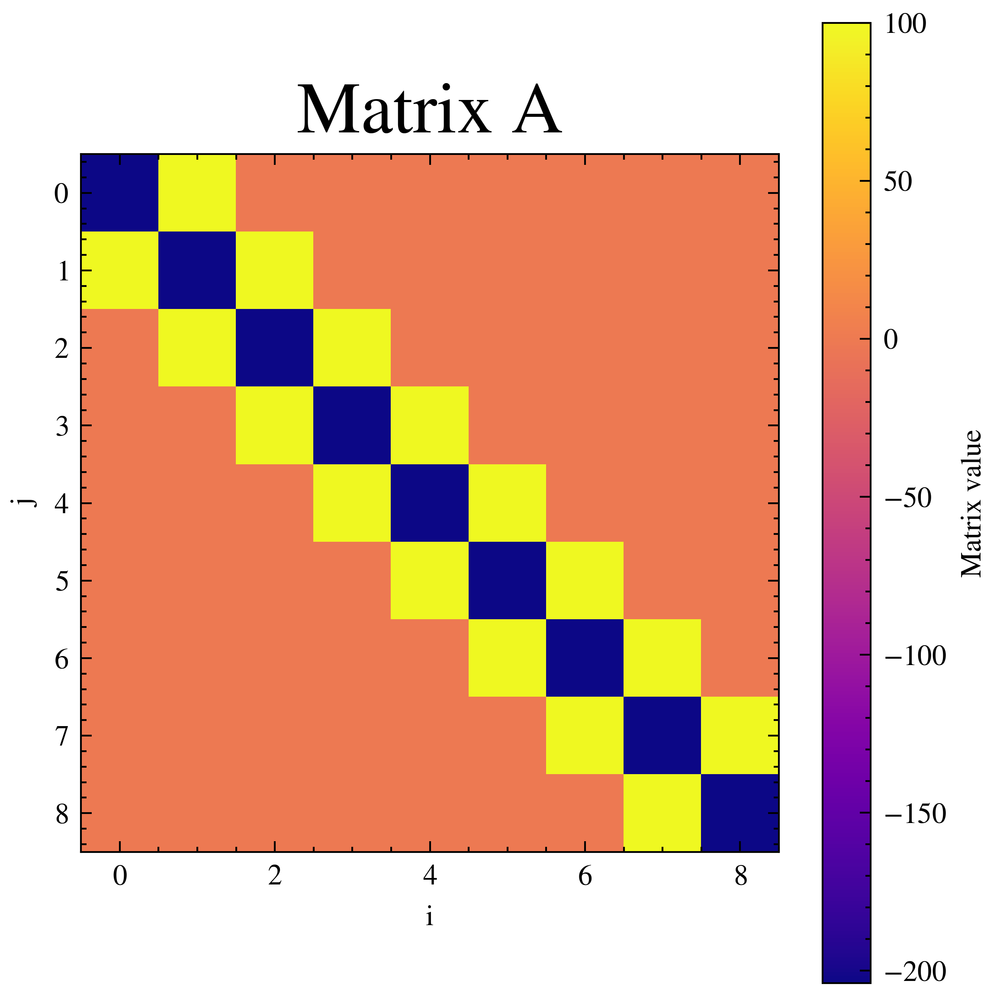

In [4]:
A = generate_matrix_A(N, h, 4, plot=True)

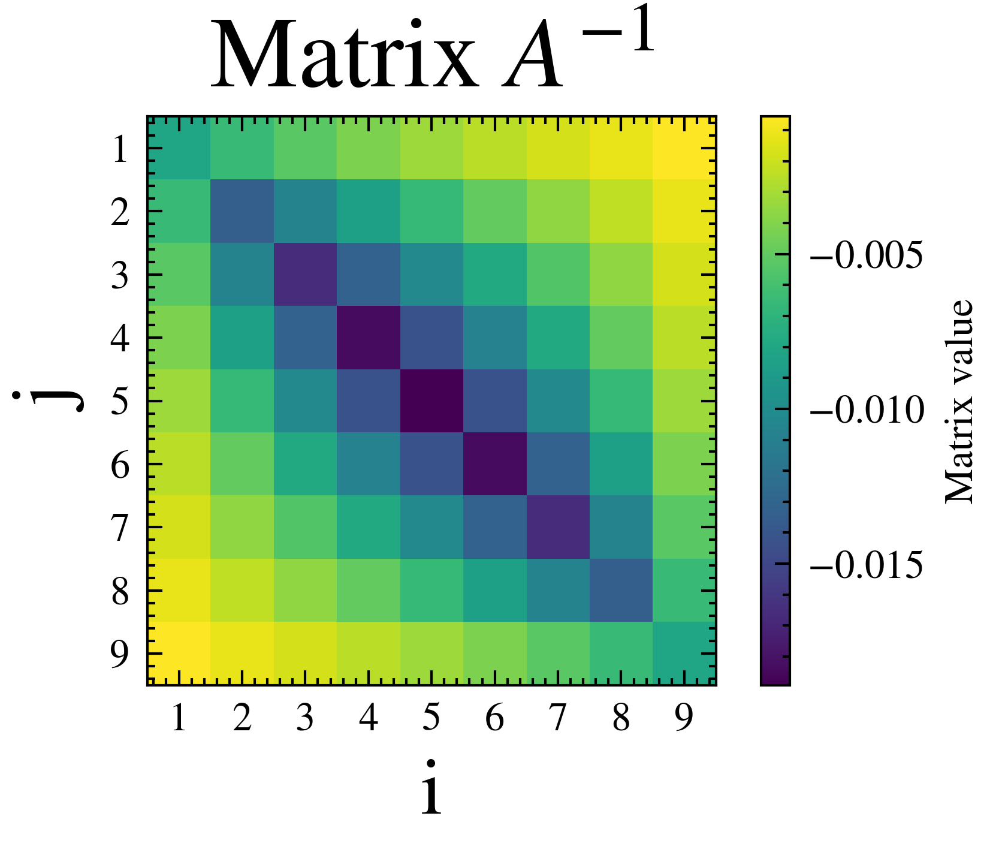

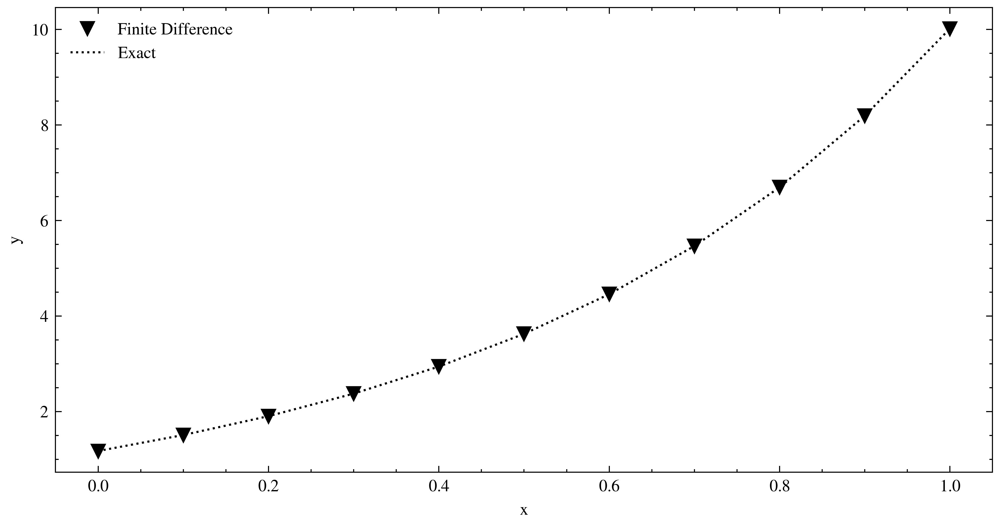

In [5]:
y_bc_left = 1.1752
y_bc_right = 10.0179

y = solve_bvp_finite_difference(N, h, A, y_bc_left, y_bc_right, plot_inverse=True, plot_exact_comparison=True)

### Example 2 Boundary Value Problem
To further illustrate the method we will apply the finite difference method to the this boundary value problem
\begin{equation}  \frac{d^2 y}{dx^2} + 2x\frac{dy}{dx}+y=3x^2,\end{equation}
with the boundary conditions
\begin{equation} y(0)=1,  y(1)=2. \end{equation}

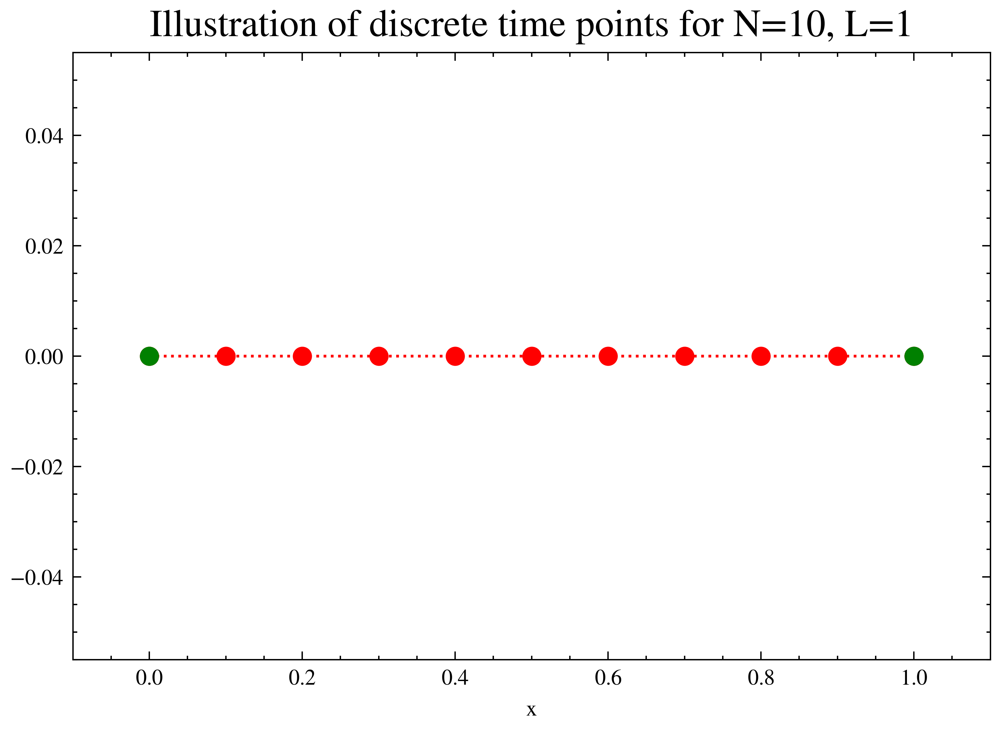

In [6]:
N = 10
a, b = 0, 1
x, h = discretize_axis(N, a, b, plot=True)

Given the differential equation
\begin{equation}  \frac{d^2 y}{dx^2} + 2x\frac{dy}{dx}+y=3x^2,\end{equation}
the difference equation is,
\begin{equation}\frac{1}{h^2}\left(y_{i-1}-2y_i+y_{i+1}\right)+2x_i\frac{y_{i+1}-y_{i-1}}{2h}+y_i=3x^2_i \ \ \ i=1,..,N-1. \end{equation}

Rearranging the equation we have the system of N-1 equations

\begin{equation}i=1: (\frac{1}{0.1^2}-\frac{2x_1}{0.2})\color{green}{y_{0}} -\left(\frac{2}{0.1^2}-1\right)y_1 +(\frac{1}{0.1^2}+\frac{2x_1}{0.2}) y_{2}=3x_1^2\end{equation}

\begin{equation}i=2: (\frac{1}{0.1^2}-\frac{2x_2}{0.2})y_{1} -\left(\frac{2}{0.1^2}-1\right)y_2 +(\frac{1}{0.1^2}+\frac{2x_2}{0.2}) y_{3}=3x_2^2\end{equation}

\begin{equation} ...\end{equation}

\begin{equation}i=8: (\frac{1}{0.1^2}-\frac{2x_8}{0.2})y_{7} -\left(\frac{2}{0.1^2}-1\right)y_8 +(\frac{1}{0.1^2}+\frac{2x_8}{0.2})y_{9}=3x_8^2\end{equation}

\begin{equation}i=9: (\frac{1}{0.1^2}-\frac{2x_9}{0.2})y_{8} -\left(\frac{2}{0.1^2}-1\right)y_9 +(\frac{1}{0.1^2}+\frac{2x_9}{0.2}) \color{green}{y_{10}}=3x_9^2\end{equation}

where the green terms are the known boundary conditions.

In [7]:
def generate_matrix_A(N, h, plot=False):
    """
    Generate the matrix A for a given N and h.

    Args:
    - N: Number of intervals
    - h: Step size
    - plot: Boolean flag to indicate whether to plot the matrix A

    Returns:
    - A: The generated matrix A
    """
    A = [[0] * (N-1) for _ in range(N-1)]
    
    # Diagonal
    for i in range(N-1):
        A[i][i] = -(2 / (h * h) - 1)

    # Off-diagonal
    for i in range(N-2):
        A[i+1][i]=1/(h*h)-2*(i+1)*h/(2*h) ## Lower Diagonal
        A[i][i+1]=1/(h*h)+2*(i+1)*h/(2*h)
    if plot:
        plt.figure(figsize=(4,4))
        plt.imshow(A, interpolation='none', cmap='plasma')
        plt.xlabel('i', fontsize=8)
        plt.ylabel('j', fontsize=8)
        #plt.yticks(range(1, N), range(1, N))
        #plt.xticks(range(1, N), range(1, N))
        clb = plt.colorbar()
        clb.set_label('Matrix value')
        plt.title('Matrix A', fontsize=20)
        plt.tight_layout()
        plt.show()
    
    return A

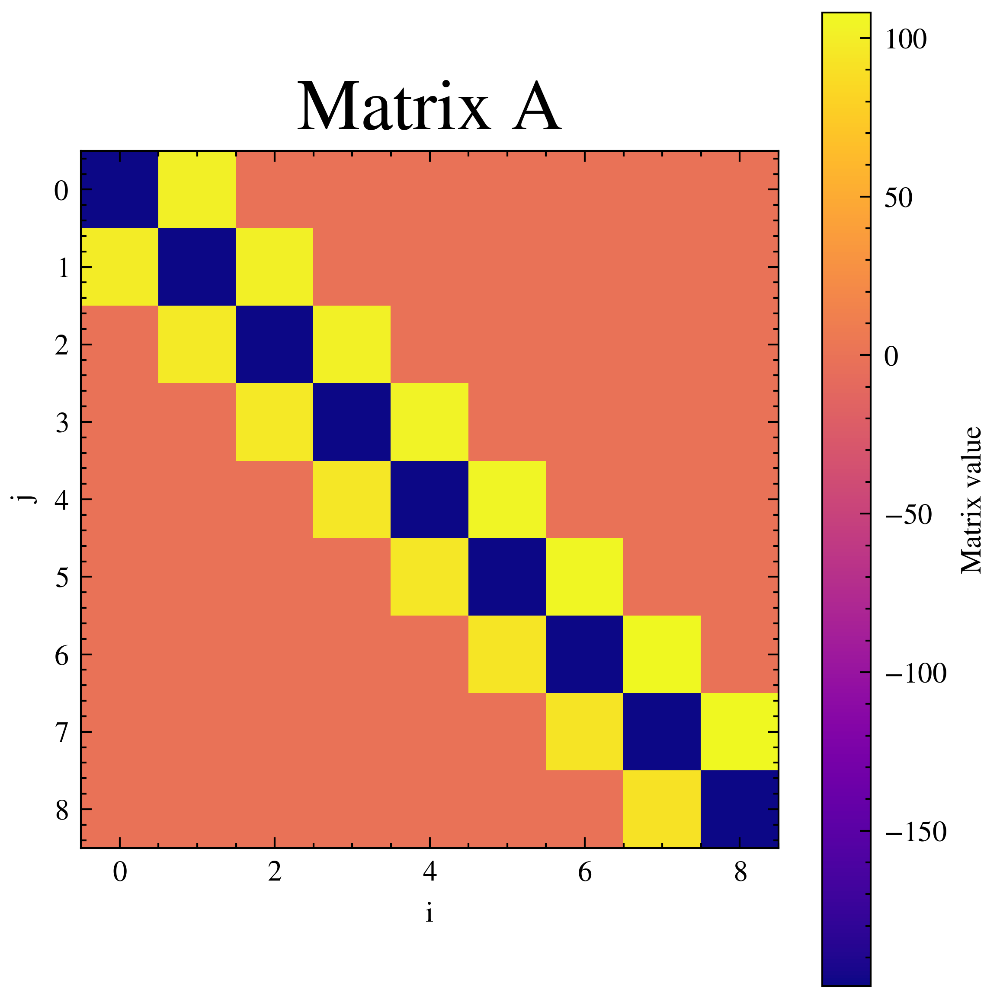

In [8]:
A = generate_matrix_A(N, h, plot=True)

In [9]:
def solve_bvp_finite_difference(N, h, A, y_bc_left, y_bc_right, plot_inverse=False, plot_exact_comparison=False):
    """
    Solve a boundary value problem using the finite difference method.

    Args:
    - N: Number of intervals
    - h: Step size
    - A: Matrix A
    - y_bc_left: Boundary condition at left boundary
    - y_bc_right: Boundary condition at right boundary
    - plot_inverse: Boolean flag to indicate whether to plot the inverse of matrix A
    - plot_exact_comparison: Boolean flag to indicate whether to compare with the exact solution

    Returns:
    - y: Solution vector
    """
    y = np.zeros(N+1)
    
    # Set boundary conditions
    y[0] = y_bc_left
    y[N] = y_bc_right

    b = np.zeros(N-1)
    
    b=np.zeros(N-1)
    for i in range (0,N-1):
        b[i]=3*h*(i+1)*h*(i+1)
        
    b[0]=-y[0]*(1/(h*h)-2*1*h/(2*h))+b[0]
    b[N-2]=-y[N]*(1/(h*h)+2*9*h/(2*h))+b[N-2]

    invA = np.linalg.inv(A)

    if plot_inverse:
        plt.imshow(invA)
        plt.xlabel('i', fontsize=16)
        plt.ylabel('j', fontsize=16)
        plt.yticks(range(N-1), range(1, N))
        plt.xticks(range(N-1), range(1, N))
        clb = plt.colorbar()
        clb.set_label('Matrix value')
        plt.title(r'Matrix $A^{-1}$', fontsize=20)
        plt.tight_layout()
        plt.show()

    y[1:N] = np.dot(invA, b)

    if plot_exact_comparison:
        x = np.linspace(0, 1, N+1)
        fig = plt.figure(figsize=(8, 4))
        plt.plot(x, y, 'v', label='Finite Difference')
        #plt.plot(x, [math.sinh(2*xi+1) for xi in x], 'k:', label='Exact')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(loc='best')
        plt.show()

    return y

and the known right hand side is a known $9\times 1$ vector with the boundary conditions
\begin{equation}
\mathbf{b}=\left(\begin{array}{c}-99+3x_1^2\\
3x_2^2\\
3x_3^2\\
.\\
.\\
3x_8^2\\
-209+3x_9^2 \end{array}\right)
\end{equation}


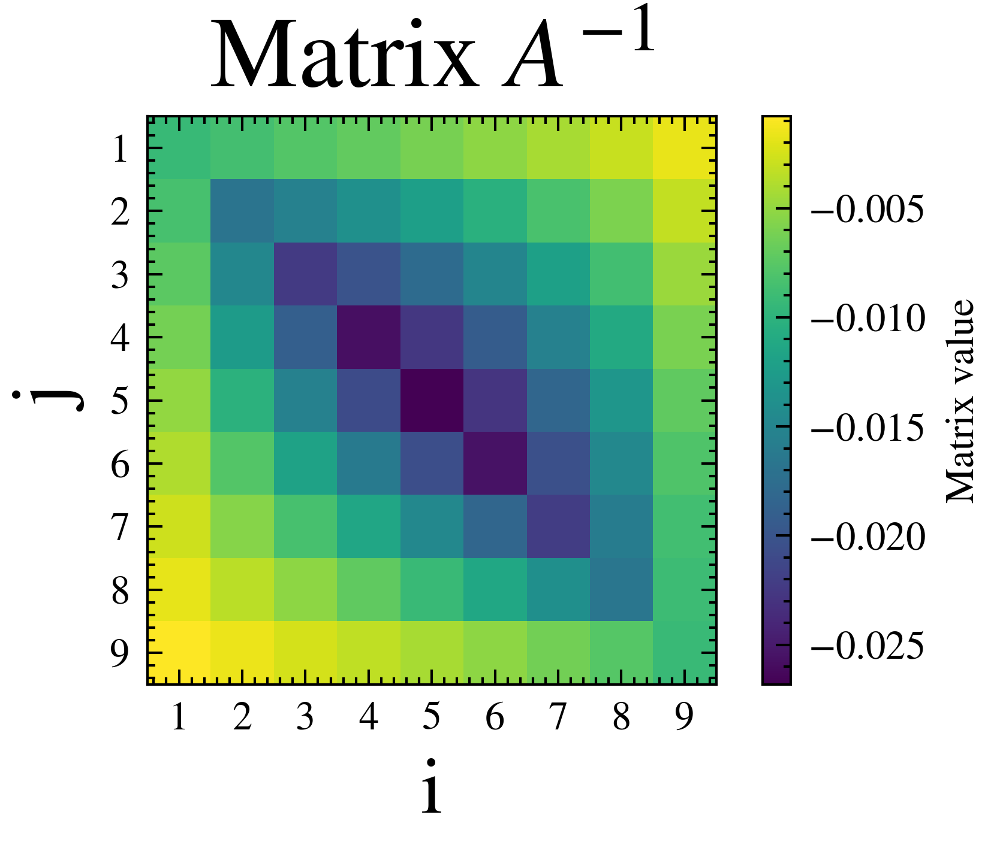

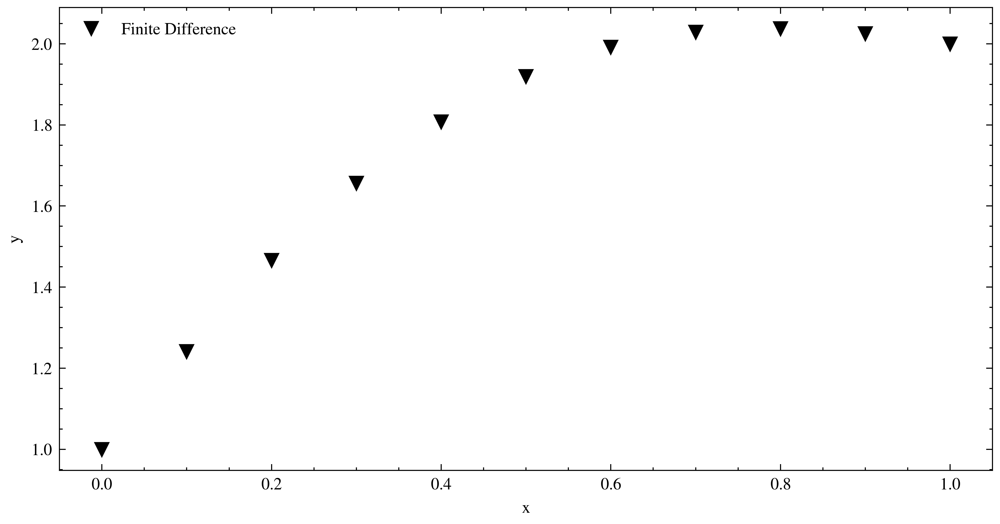

In [10]:
y_bc_left = 1
y_bc_right = 2

y = solve_bvp_finite_difference(N, h, A, y_bc_left, y_bc_right, plot_inverse=True, plot_exact_comparison=True)

## The Heat Equation
The Heat Equation is the first order in time ($t$) and second order in space ($x$) Partial Differential Equation: 
\begin{equation} \frac{\partial u}{\partial t} = \frac{\partial^2 u}{\partial x^2},\end{equation}
the equation describes heat transfer on a domain
\begin{equation} \Omega = \{ t \geq, 0\leq x \leq 1\}. \end{equation}
with an initial condition at time $t=0$ for all $x$ and boundary condition on the left ($x=0$) and right side ($x=1$).

## Backward Time Centered Space (BTCS) Difference method
This notebook will illustrate the Backward Time Centered Space (BTCS) Difference method for the Heat Equation with the __initial conditions__  
\begin{equation} u(x,0)=2x, \ \ 0 \leq x \leq \frac{1}{2}, \end{equation}

\begin{equation}u(x,0)=2(1-x), \ \ \frac{1}{2}  \leq x \leq 1, \end{equation}
and __boundary condition__

\begin{equation} u(0,t)=0,  u(1,t)=0. \end{equation}

In [17]:
N = 10
Nt = 100
h = 1 / N
k = 1 / Nt
r = k / (h * h)
time_steps = 10
time = np.arange(0, (time_steps + 0.5) * k, k)
x = np.arange(0, 1.001, h)
X, Y = np.meshgrid(x, time)

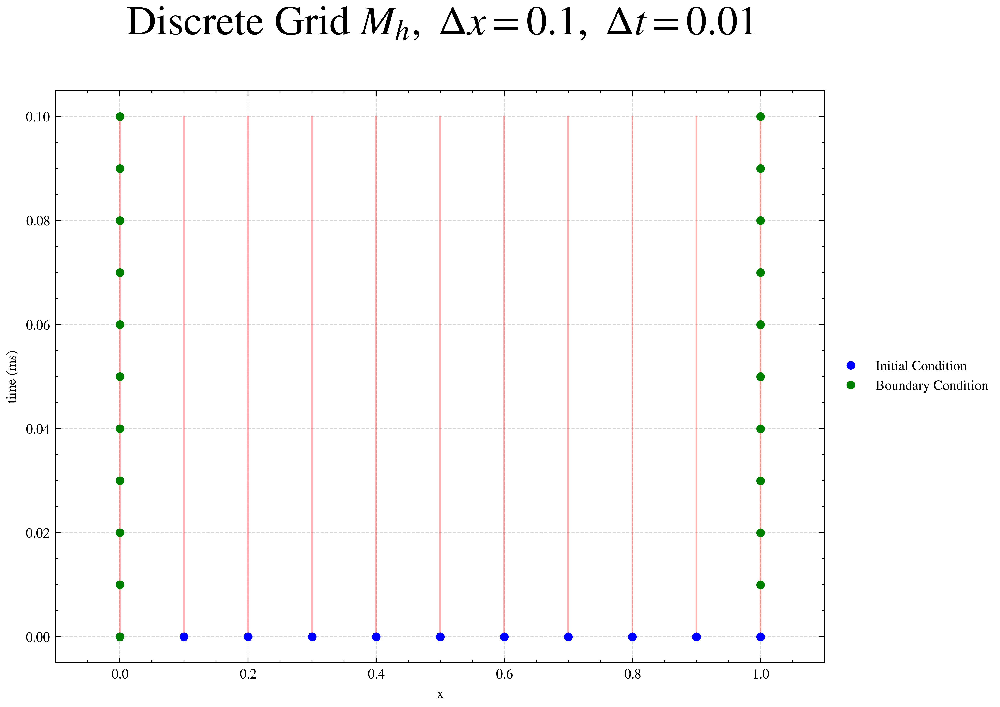

In [18]:
fig = plt.figure(figsize=(8, 6))
plt.plot(X, Y, 'r-', alpha=0.3)  
plt.plot(x, 0 * x, 'bo', markersize=4, label='Initial Condition')  
plt.plot(np.ones(time_steps + 1) * 1, time, 'go', markersize=4, label='Boundary Condition')  
plt.plot(x, 0 * x, 'bo', markersize=4)
plt.plot(0 * time, time, 'go', markersize=4)
plt.xlim((-0.1, 1.1))  
#plt.ylim((0, 0.055))   
plt.xlabel('x')
plt.ylabel('time (ms)')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title(r'Discrete Grid $M_h,$ $\Delta x= %s,$ $\Delta t=%s$' % (h, k), fontsize=24, y=1.08)
plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines
plt.show()

## Discrete Initial and Boundary Conditions

The discrete initial conditions are 
\begin{equation} w[i,0]=2x[i], \ \ 0 \leq x[i] \leq \frac{1}{2} \end{equation}

\begin{equation} w[i,0]=2(1-x[i]), \ \ \frac{1}{2}  \leq x[i] \leq 1 \end{equation}

and the discete boundary conditions are 
\begin{equation} w[0,j]=0,  w[10,j]=0,\end{equation}

where $w[i,j]$ is the numerical approximation of $U(x[i],t[j])$.

The Figure below plots values of $w[i,0]$ for the inital (blue) and boundary (red) conditions for $t[0]=0.$

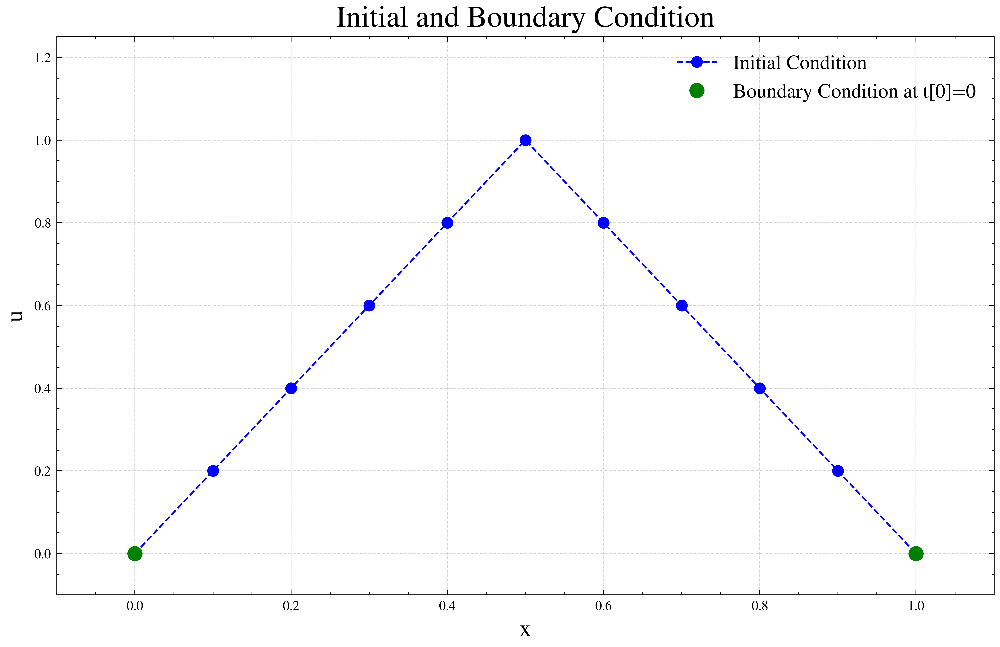

In [19]:
u = np.zeros((N+1, time_steps+1))
b = np.zeros(N-1)

# Initial Condition
for i in range(1, N):
    u[i,0]=2*x[i]
    if x[i]>0.5:
        u[i,0]=2*(1-x[i])

# Boundary Condition
u[0, :] = 0
u[N, :] = 0

# Plot
fig = plt.figure(figsize=(10, 6))

# Initial and Boundary Condition at t[0]=0
plt.plot(x, u[:, 0], 'o--', color='blue', label='Initial Condition')
plt.plot(x[[0, N]], u[[0, N], 0], 'go', markersize=8, label='Boundary Condition at t[0]=0')

plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.25])
plt.title('Initial and Boundary Condition', fontsize=18)
plt.xlabel('x', fontsize=14)
plt.ylabel('u', fontsize=14)
plt.legend(loc='upper right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()

## The Implicit Backward Time Centered Space (BTCS) Difference Equation



The implicit Backward Time Centered Space (BTCS) difference equation of the Heat Equation is derived by discretising 
\begin{equation} \frac{\partial u_{ij+1}}{\partial t} = \frac{\partial^2 u_{ij+1}}{\partial x^2},\end{equation}
around $(x_i,t_{j+1})$ giving the difference equation
\begin{equation}
\frac{w_{ij+1}-w_{ij}}{k}=\frac{w_{i+1j+1}-2w_{ij+1}+w_{i-1j+1}}{h^2}
\end{equation}
Rearranging the equation we get
\begin{equation}
-rw_{i-1j+1}+(1+2r)w_{ij+1}-rw_{i+1j+1}=w_{ij}
\end{equation}
for $i=1,...9$ where $r=\frac{k}{h^2}$.

This gives the formula for the unknown term $w_{ij+1}$ at the $(ij+1)$ mesh points
in terms of $x[i]$ along the jth time row.

Hence we can calculate the unknown pivotal values of $w$ along the first row of $j=1$ in terms of the known boundary conditions.

This can be written in matrix form 
\begin{equation} A\mathbf{w}_{j+1}=\mathbf{w}_{j} +\mathbf{b}_{j+1} \end{equation}
for which $A$ is a $9\times9$ matrix:
\begin{equation}
\left(\begin{array}{cccc cccc}
1+2r&-r& 0&0&0 &0&0&0\\
-r&1+2r&-r&0&0&0 &0&0&0\\
0&-r&1+2r &-r&0&0& 0&0&0\\
0&0&-r&1+2r &-r&0&0& 0&0\\
0&0&0&-r&1+2r &-r&0&0& 0\\
0&0&0&0&-r&1+2r &-r&0&0\\
0&0&0&0&0&-r&1+2r &-r&0\\
0&0&0&0&0&0&-r&1+2r&-r\\
0&0&0&0&0&0&0&-r&1+2r\\
\end{array}\right)
\left(\begin{array}{c}
w_{1j+1}\\
w_{2j+1}\\
w_{3j+1}\\
w_{4j+1}\\
w_{5j+1}\\
w_{6j+1}\\
w_{7j+1}\\
w_{8j+1}\\
w_{9j+1}\\
\end{array}\right)=
\left(\begin{array}{c}
w_{1j}\\
w_{2j}\\
w_{3j}\\
w_{4j}\\
w_{5j}\\
w_{6j}\\
w_{7j}\\
w_{8j}\\
w_{9j}\\
\end{array}\right)+
\left(\begin{array}{c}
rw_{0j+1}\\
0\\
0\\
0\\
0\\
0\\
0\\
0\\
rw_{10j+1}\\
\end{array}\right).
\end{equation}
It is assumed that the boundary values $w_{0j+1}$ and $w_{10j+1}$ are known for $j=1,2,...$, and $w_{i0}$ for $i=0,...,10$ is the initial condition.
The Figure below shows the values of the $9\times 9$  matrix in colour plot form for $r=\frac{k}{h^2}$.

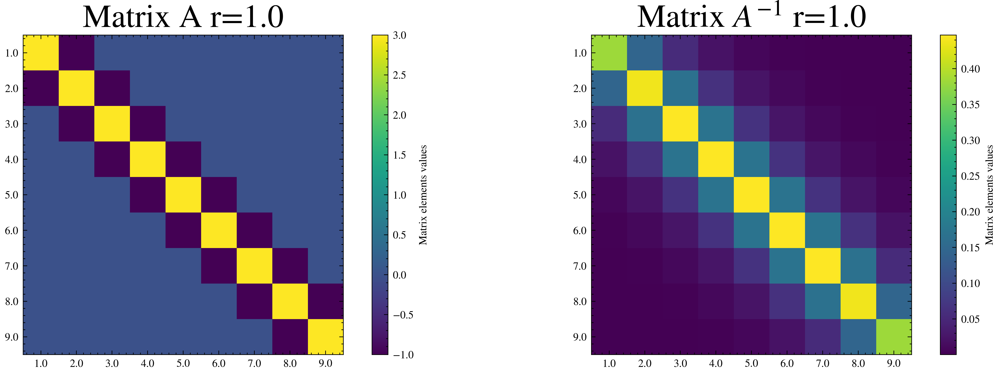

In [20]:
A=np.zeros((N-1,N-1))
for i in range (0,N-1):
    A[i,i]=1+2*r

for i in range (0,N-2):           
    A[i+1,i]=-r
    A[i,i+1]=-r
    
Ainv=np.linalg.inv(A)   
fig = plt.figure(figsize=(12,4));
plt.subplot(121)
plt.imshow(A,interpolation='none');
plt.xticks(np.arange(N-1), np.arange(1,N-0.9,1));
plt.yticks(np.arange(N-1), np.arange(1,N-0.9,1));
clb=plt.colorbar();
clb.set_label('Matrix elements values');
#clb.set_clim((-1,1));
plt.title('Matrix A r=%s'%(np.round(r,3)),fontsize=24)

plt.subplot(122)
plt.imshow(Ainv,interpolation='none');
plt.xticks(np.arange(N-1), np.arange(1,N-0.9,1));
plt.yticks(np.arange(N-1), np.arange(1,N-0.9,1));
clb=plt.colorbar();
clb.set_label('Matrix elements values');
#clb.set_clim((-1,1));
plt.title(r'Matrix $A^{-1}$ r=%s'%(np.round(r,3)),fontsize=24)

fig.tight_layout()
plt.show();

## Results
To numerically approximate the solution at $t[1]$ the matrix equation becomes 


\begin{equation} \mathbf{w}_{1}=A^{-1}(\mathbf{w}_{0} +\mathbf{b}_{1}) \end{equation}
where all the right hand side is known. 
To approximate solution at time $t[2]$ we use the matrix equation
\begin{equation} \mathbf{w}_{2}=A^{-1}(\mathbf{w}_{1} +\mathbf{b}_{2}).
\end{equation}
Each set of numerical solutions $w[i,j]$ for all $i$ at the previous time step is used to approximate the solution $w[i,j+1]$. 
The Figure below shows the numerical approximation $w[i,j]$ of the Heat Equation using the FTCS method at $x[i]$ for $i=0,...,10$ and time steps $t[j]$ for $j=1,...,15$. The left plot shows the numerical approximation $w[i,j]$ as a function of $x[i]$ with each color representing the different time steps $t[j]$. The right plot shows the numerical approximation $w[i,j]$ as colour plot as a function of $x[i]$, on the $x[i]$ axis and time $t[j]$ on the $y$ axis. 
The solution is stable for $r>\frac{1}{2}$ unlike in the explicit method.

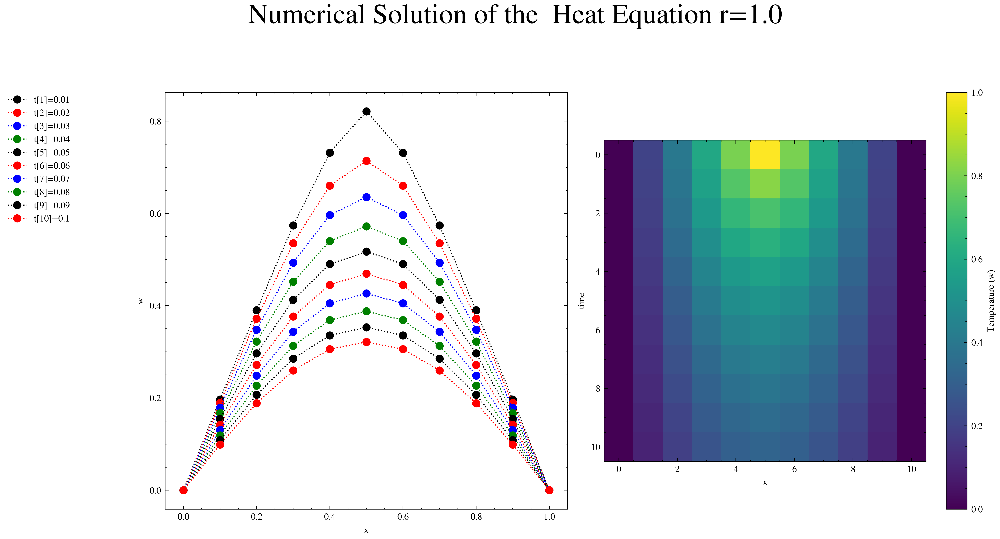

In [21]:
fig = plt.figure(figsize=(12,6))

plt.subplot(121)
for j in range (1,time_steps+1):
    b[0]=r*u[0,j]
    b[N-2]=r*u[N,j]
    u[1:(N),j]=np.dot(Ainv,u[1:(N),j-1]+b)
    plt.plot(x,u[:,j],'o:',label='t[%s]=%s'%(j,time[j]))
plt.xlabel('x')
plt.ylabel('w')
#plt.legend(loc='bottom', bbox_to_anchor=(0.5, -0.1))
plt.legend(bbox_to_anchor=(-.4, 1), loc=2, borderaxespad=0.)

plt.subplot(122)
plt.imshow(u.transpose())
plt.xlabel('x')
plt.ylabel('time')
clb=plt.colorbar()
clb.set_label('Temperature (w)')
plt.suptitle('Numerical Solution of the  Heat Equation r=%s'%(np.round(r,3)),fontsize=24,y=1.08)
fig.tight_layout()
plt.show()

In [27]:
table = tabulate(u, headers=[f't_{i}' for i in range(u.shape[1])], showindex=x.tolist(), tablefmt="grid")
print(table)

+-----+-------+----------+----------+----------+----------+----------+----------+----------+----------+----------+-----------+
|     |   t_0 |      t_1 |      t_2 |      t_3 |      t_4 |      t_5 |      t_6 |      t_7 |      t_8 |      t_9 |      t_10 |
+=====+=======+==========+==========+==========+==========+==========+==========+==========+==========+==========+===========+
| 0   |   0   | 0        | 0        | 0        | 0        | 0        | 0        | 0        | 0        | 0        | 0         |
+-----+-------+----------+----------+----------+----------+----------+----------+----------+----------+----------+-----------+
| 0.1 |   0.2 | 0.196748 | 0.189477 | 0.17917  | 0.167179 | 0.154596 | 0.142135 | 0.130205 | 0.119009 | 0.108627 | 0.0990678 |
+-----+-------+----------+----------+----------+----------+----------+----------+----------+----------+----------+-----------+
| 0.2 |   0.4 | 0.390244 | 0.371684 | 0.348033 | 0.322367 | 0.296608 | 0.271809 | 0.24848  | 0.226822 | 0.20687

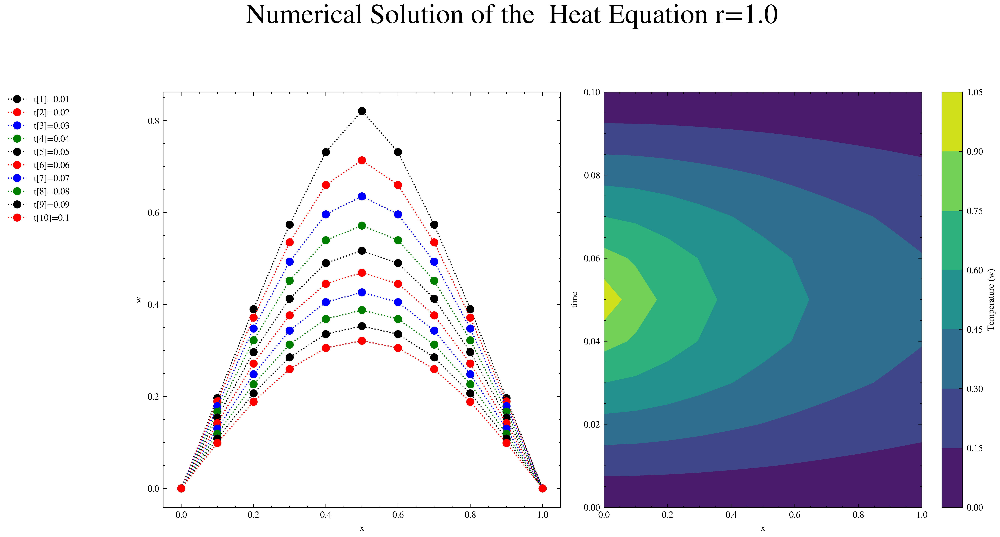

In [26]:
fig = plt.figure(figsize=(12, 6))

plt.subplot(121)
for j in range(1, time_steps + 1):
    b[0] = r * u[0, j]
    b[N - 2] = r * u[N, j]
    u[1:(N), j] = np.dot(Ainv, u[1:(N), j - 1] + b)
    plt.plot(x, u[:, j], 'o:', label='t[%s]=%s' % (j, time[j]))
plt.xlabel('x')
plt.ylabel('w')
plt.legend(bbox_to_anchor=(-.4, 1), loc=2, borderaxespad=0.)

# (contour plot)
plt.subplot(122)
plt.contourf(X, Y, u, cmap='viridis')
plt.colorbar(label='Temperature (w)')
plt.xlabel('x')
plt.ylabel('time')

plt.suptitle('Numerical Solution of the  Heat Equation r=%s' % (np.round(r, 3)), fontsize=24, y=1.08)
plt.tight_layout()
plt.show()

## Crank-Nicolson Difference method

The implicit Crank-Nicolson difference equation of the Heat Equation
is derived by discretising the
\begin{equation}  \frac{\partial u_{ij+\frac{1}{2}}}{\partial t} = \frac{\partial^2 u_{ij+\frac{1}{2}}}{\partial x^2},\end{equation}
around $(x_i,t_{j+\frac{1}{2}})$ giving the difference equation
\begin{equation}
\frac{w_{ij+1}-w_{ij}}{k}=\frac{1}{2}\left(\frac{w_{i+1j+1}-2w_{ij+1}+w_{i-1j+1}}{h^2}+\frac{w_{i+1j}-2w_{ij}+w_{i-1j}}{h^2}\right).
\end{equation}
Rearranging give the difference equation 
\begin{equation}
-rw_{i-1j+1}+(2+2r)w_{ij+1}-rw_{i+1j+1}=rw_{i-1j}+(2-2r)w_{ij}+rw_{i+1j}
\end{equation}
for $i=1,...9$ where $r=\frac{k}{h^2}$.

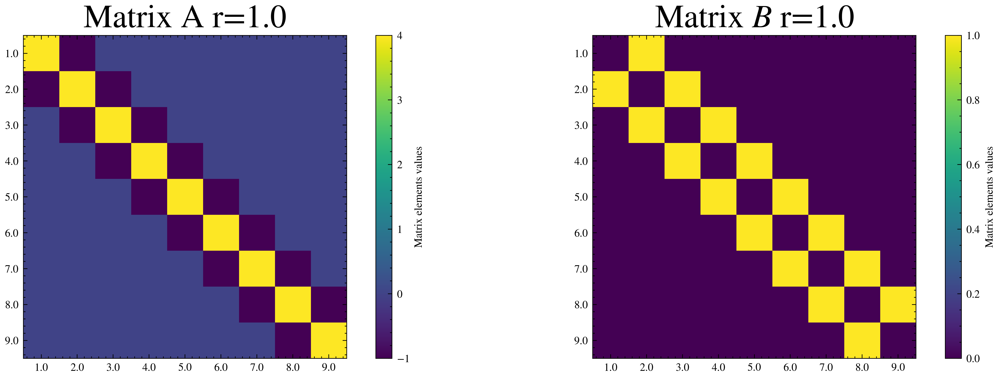

In [28]:
A=np.zeros((N-1,N-1))
B=np.zeros((N-1,N-1))
for i in range (0,N-1):
    A[i,i]=2+2*r
    B[i,i]=2-2*r

for i in range (0,N-2):           
    A[i+1,i]=-r
    A[i,i+1]=-r
    B[i+1,i]=r
    B[i,i+1]=r
    
Ainv=np.linalg.inv(A)   
fig = plt.figure(figsize=(12,4));
plt.subplot(121)
plt.imshow(A,interpolation='none');
plt.xticks(np.arange(N-1), np.arange(1,N-0.9,1));
plt.yticks(np.arange(N-1), np.arange(1,N-0.9,1));
clb=plt.colorbar();
clb.set_label('Matrix elements values');
#clb.set_clim((-1,1));
plt.title('Matrix A r=%s'%(np.round(r,3)),fontsize=24)

plt.subplot(122)
plt.imshow(B,interpolation='none');
plt.xticks(np.arange(N-1), np.arange(1,N-0.9,1));
plt.yticks(np.arange(N-1), np.arange(1,N-0.9,1));
clb=plt.colorbar();
clb.set_label('Matrix elements values');
#clb.set_clim((-1,1));
plt.title(r'Matrix $B$ r=%s'%(np.round(r,3)),fontsize=24)
fig.tight_layout()
plt.show();

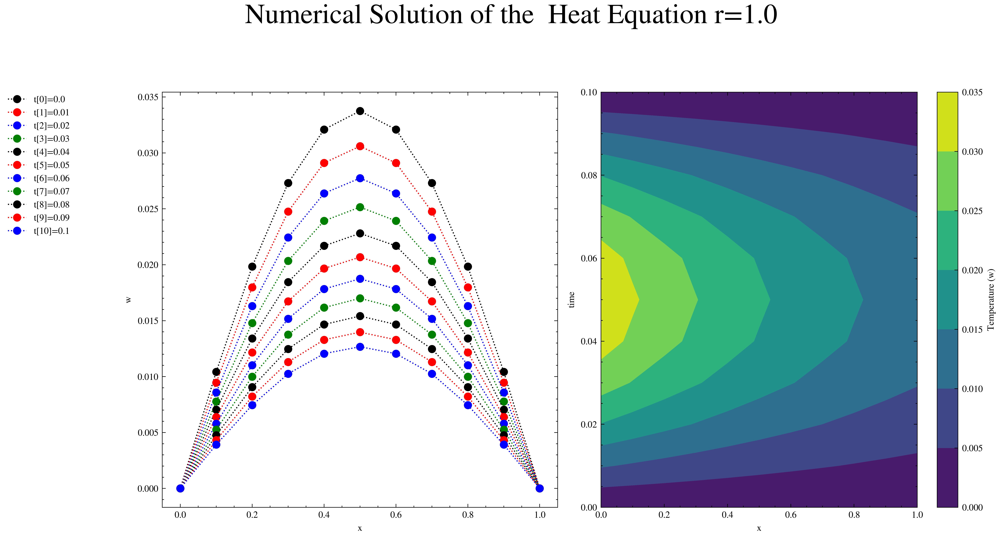

In [33]:
fig = plt.figure(figsize=(12,6))
plt.subplot(121)
for j in range (0,time_steps+1):
    b[0]=r*u[0,j-1]+r*u[0,j]
    b[N-2]=r*u[N,j-1]+r*u[N,j]
    v=np.dot(B,u[1:(N),j-1])
    u[1:(N),j]=np.dot(Ainv,v+b)
    plt.plot(x,u[:,j],'o:',label='t[%s]=%s'%(j,time[j]))
plt.xlabel('x')
plt.ylabel('w')
#plt.legend(loc='bottom', bbox_to_anchor=(0.5, -0.1))
plt.legend(bbox_to_anchor=(-.4, 1), loc=2, borderaxespad=0.)

# (contour plot)
plt.subplot(122)
plt.contourf(X, Y, u, cmap='viridis')
plt.colorbar(label='Temperature (w)')
plt.xlabel('x')
plt.ylabel('time')

plt.suptitle('Numerical Solution of the  Heat Equation r=%s' % (np.round(r, 3)), fontsize=24, y=1.08)
plt.tight_layout()
plt.show()

In [32]:
table = tabulate(u, headers=[f't_{i}' for i in range(u.shape[1])], showindex=x.tolist(), tablefmt="grid")
print(table)

+-----+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+
|     |       t_0 |       t_1 |       t_2 |       t_3 |       t_4 |       t_5 |       t_6 |       t_7 |       t_8 |       t_9 |      t_10 |
+=====+===========+===========+===========+===========+===========+===========+===========+===========+===========+===========+===========+
| 0   | 0         | 0         | 0         | 0         | 0         | 0         | 0         | 0         | 0         | 0         | 0         |
+-----+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+
| 0.1 | 0.0306353 | 0.0277764 | 0.0251843 | 0.0228341 | 0.0207033 | 0.0187712 | 0.0170195 | 0.0154313 | 0.0139912 | 0.0126856 | 0.0115018 |
+-----+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+
| 0.2 | 0.0582718 | 

## The Heat Equation
The Heat Equation is the first order in time ($t$) and second order in space ($x$) Partial Differential Equation: 
\begin{equation}  \frac{\partial u}{\partial t} = \frac{\partial^2 u}{\partial x^2},\end{equation}
The equation describes heat transfer on a domain
\begin{equation}\Omega = \{ t \geq, 0\leq x \leq 1\}. \end{equation}
with an initial condition at time $t=0$ for all $x$ and boundary condition on the left ($x=0$) and right side ($x=1$).

## Crank-Nicolson Difference method
This note book will illustrate the Crank-Nicolson Difference method for the Heat Equation with the __initial conditions__  
\begin{equation} u(x,0)=x^2, \ \ 0 \leq x \leq 1, \end{equation}
and __boundary condition__
\begin{equation} u(0,t)=t,  u(1,t)=2-exp(-t). \end{equation}

In [34]:
N = 10
Nt = 100
h = 1 / N
k = 1 / Nt
r = k / (h * h)
time_steps = 10
time = np.arange(0, (time_steps + 0.5) * k, k)
x = np.arange(0, 1.001, h)
X, Y = np.meshgrid(x, time)

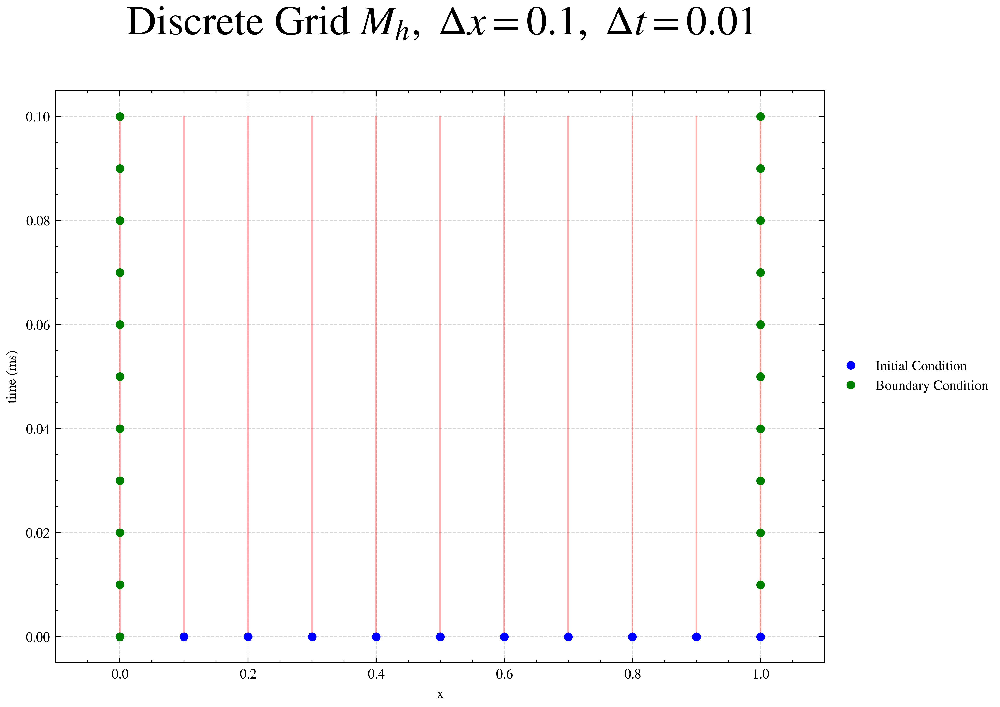

In [35]:
fig = plt.figure(figsize=(8, 6))
plt.plot(X, Y, 'r-', alpha=0.3)  
plt.plot(x, 0 * x, 'bo', markersize=4, label='Initial Condition')  
plt.plot(np.ones(time_steps + 1) * 1, time, 'go', markersize=4, label='Boundary Condition')  
plt.plot(x, 0 * x, 'bo', markersize=4)
plt.plot(0 * time, time, 'go', markersize=4)
plt.xlim((-0.1, 1.1))  
#plt.ylim((0, 0.055))   
plt.xlabel('x')
plt.ylabel('time (ms)')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title(r'Discrete Grid $M_h,$ $\Delta x= %s,$ $\Delta t=%s$' % (h, k), fontsize=24, y=1.08)
plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines
plt.show()

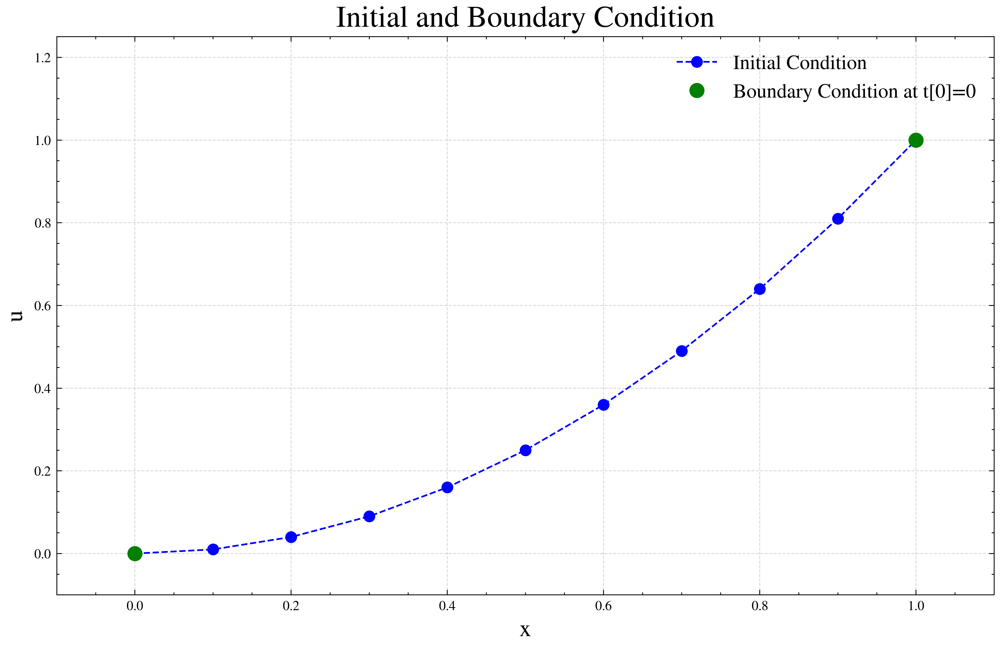

In [36]:
u = np.zeros((N+1, time_steps+1))
b = np.zeros(N-1)

# Initial Condition
for i in range(1, N):
    u[i,0]=x[i]*x[i]

# Boundary Condition
for j in range (0,time_steps+1):
    u[0,j]=time[j]
    u[N,j]=2-math.exp(-time[j])

# Plot
fig = plt.figure(figsize=(10, 6))

# Initial and Boundary Condition at t[0]=0
plt.plot(x, u[:, 0], 'o--', color='blue', label='Initial Condition')
plt.plot(x[[0, N]], u[[0, N], 0], 'go', markersize=8, label='Boundary Condition at t[0]=0')

plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.25])
plt.title('Initial and Boundary Condition', fontsize=18)
plt.xlabel('x', fontsize=14)
plt.ylabel('u', fontsize=14)
plt.legend(loc='upper right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()

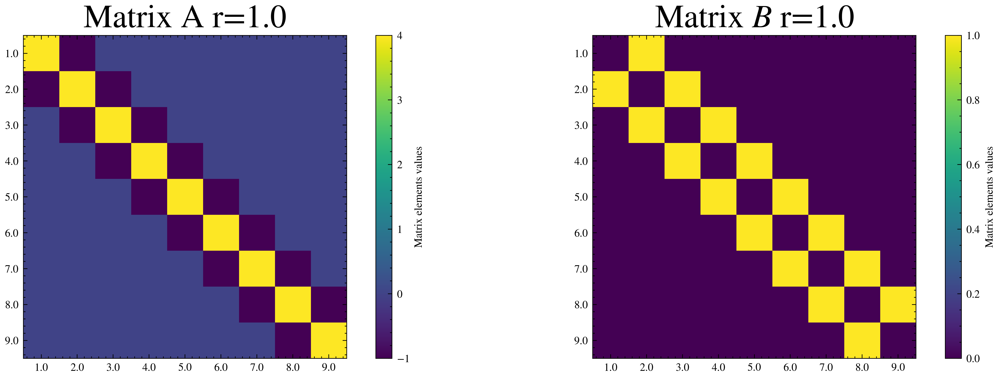

In [37]:
A=np.zeros((N-1,N-1))
B=np.zeros((N-1,N-1))
for i in range (0,N-1):
    A[i,i]=2+2*r
    B[i,i]=2-2*r

for i in range (0,N-2):           
    A[i+1,i]=-r
    A[i,i+1]=-r
    B[i+1,i]=r
    B[i,i+1]=r
    
Ainv=np.linalg.inv(A)   
fig = plt.figure(figsize=(12,4));
plt.subplot(121)
plt.imshow(A,interpolation='none');
plt.xticks(np.arange(N-1), np.arange(1,N-0.9,1));
plt.yticks(np.arange(N-1), np.arange(1,N-0.9,1));
clb=plt.colorbar();
clb.set_label('Matrix elements values');
#clb.set_clim((-1,1));
plt.title('Matrix A r=%s'%(np.round(r,3)),fontsize=24)

plt.subplot(122)
plt.imshow(B,interpolation='none');
plt.xticks(np.arange(N-1), np.arange(1,N-0.9,1));
plt.yticks(np.arange(N-1), np.arange(1,N-0.9,1));
clb=plt.colorbar();
clb.set_label('Matrix elements values');
#clb.set_clim((-1,1));
plt.title(r'Matrix $B$ r=%s'%(np.round(r,3)),fontsize=24)
fig.tight_layout()
plt.show();

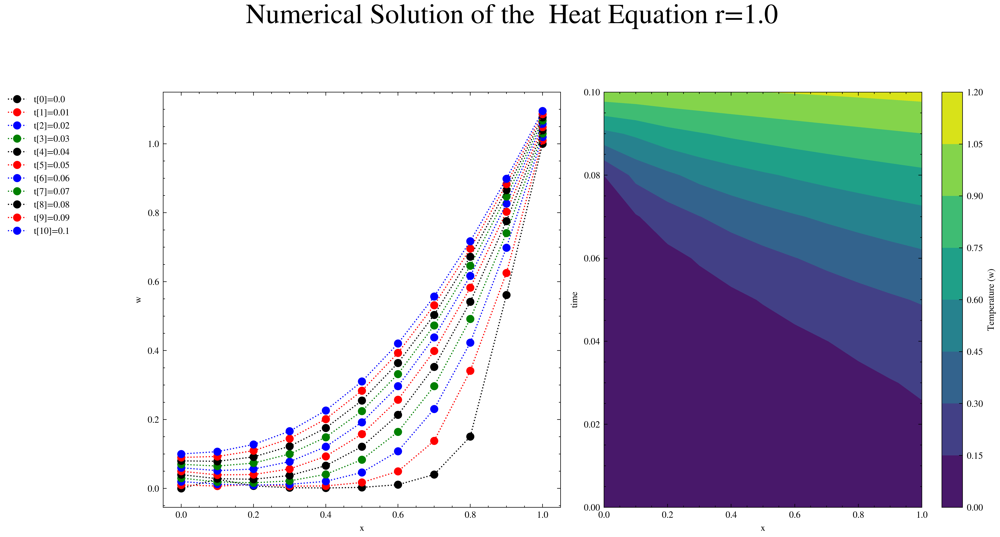

In [38]:
fig = plt.figure(figsize=(12,6))
plt.subplot(121)
for j in range (0,time_steps+1):
    b[0]=r*u[0,j-1]+r*u[0,j]
    b[N-2]=r*u[N,j-1]+r*u[N,j]
    v=np.dot(B,u[1:(N),j-1])
    u[1:(N),j]=np.dot(Ainv,v+b)
    plt.plot(x,u[:,j],'o:',label='t[%s]=%s'%(j,time[j]))
plt.xlabel('x')
plt.ylabel('w')
#plt.legend(loc='bottom', bbox_to_anchor=(0.5, -0.1))
plt.legend(bbox_to_anchor=(-.4, 1), loc=2, borderaxespad=0.)

# (contour plot)
plt.subplot(122)
plt.contourf(X, Y, u, cmap='viridis')
plt.colorbar(label='Temperature (w)')
plt.xlabel('x')
plt.ylabel('time')

plt.suptitle('Numerical Solution of the  Heat Equation r=%s' % (np.round(r, 3)), fontsize=24, y=1.08)
plt.tight_layout()
plt.show()

In [39]:
table = tabulate(u, headers=[f't_{i}' for i in range(u.shape[1])], showindex=x.tolist(), tablefmt="grid")
print(table)

+-----+------------+------------+------------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+----------+
|     |        t_0 |        t_1 |        t_2 |       t_3 |       t_4 |       t_5 |       t_6 |       t_7 |       t_8 |       t_9 |     t_10 |
+=====+============+============+============+===========+===========+===========+===========+===========+===========+===========+==========+
| 0   | 0          | 0.01       | 0.02       | 0.03      | 0.04      | 0.05      | 0.06      | 0.07      | 0.08      | 0.09      | 0.1      |
+-----+------------+------------+------------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+----------+
| 0.1 | 0.0268088  | 0.00696554 | 0.0125379  | 0.0189642 | 0.0282396 | 0.0392505 | 0.0516678 | 0.0649611 | 0.0787503 | 0.0927492 | 0.106765 |
+-----+------------+------------+------------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+----------+
| 0.2 

In [41]:
N = 20
Nt = 400
h = 8 / N
k = 1 / Nt
r = k / (h * h)
time_steps = 500
time = np.arange(0, (time_steps + 0.5) * k, k)
x = np.arange(0, 8.0001, h)
X, Y = np.meshgrid(x, time)

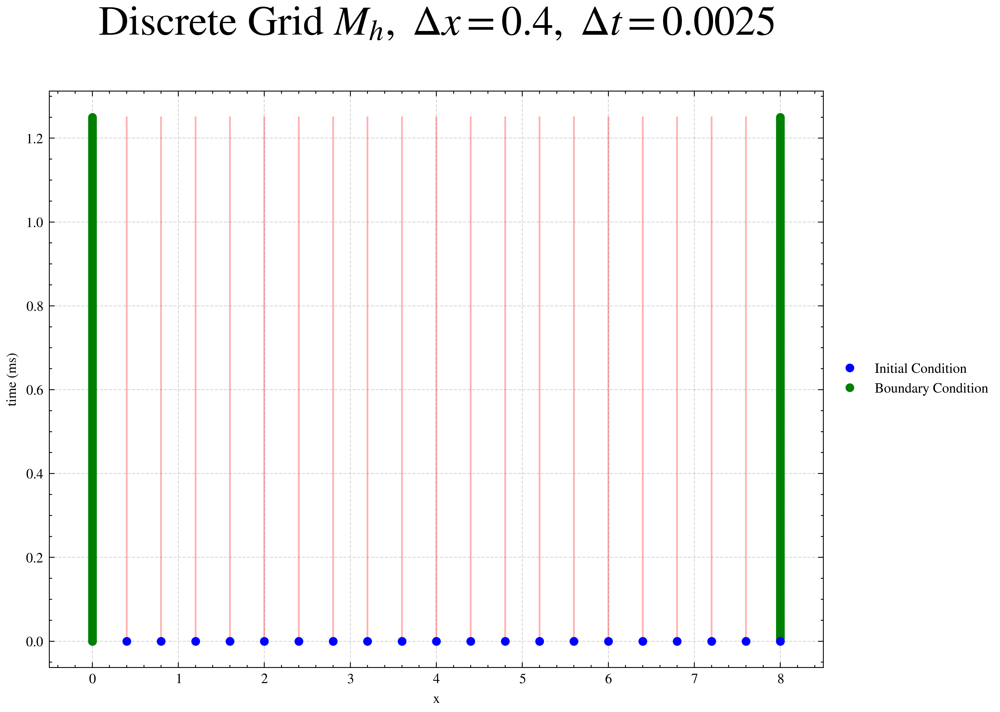

In [42]:
fig = plt.figure(figsize=(8, 6))
plt.plot(X, Y, 'r-', alpha=0.3)  
plt.plot(x, 0 * x, 'bo', markersize=4, label='Initial Condition')  
plt.plot(np.ones(time_steps + 1) * 8, time, 'go', markersize=4, label='Boundary Condition')  
plt.plot(x, 0 * x, 'bo', markersize=4)
plt.plot(0 * time, time, 'go', markersize=4)
plt.xlim((-0.5, 8.5))  
#plt.ylim((0, 0.055))   
plt.xlabel('x')
plt.ylabel('time (ms)')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title(r'Discrete Grid $M_h,$ $\Delta x= %s,$ $\Delta t=%s$' % (h, k), fontsize=24, y=1.08)
plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines
plt.show()

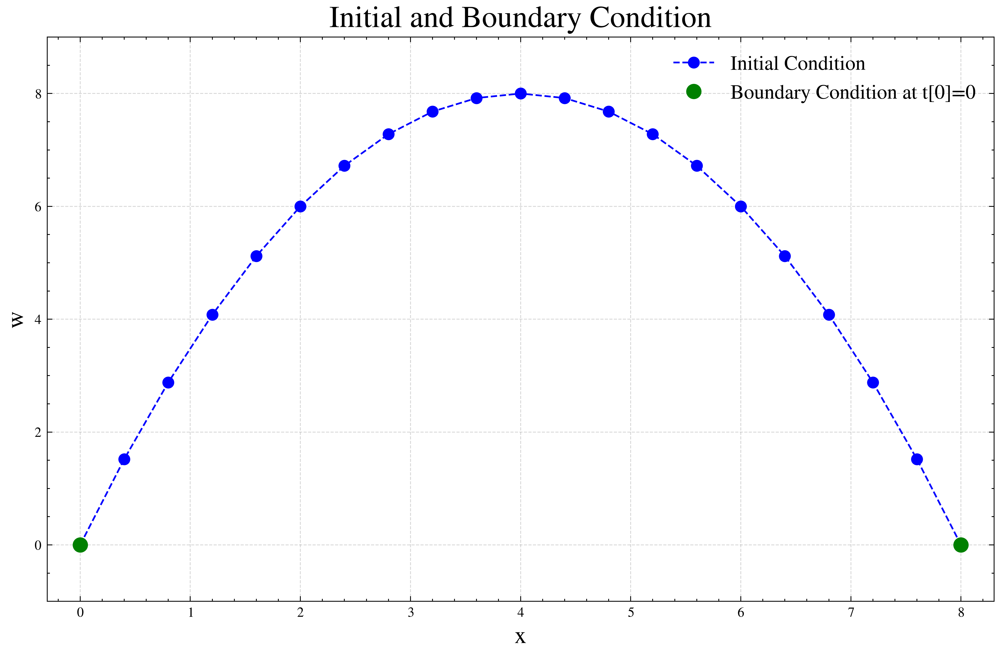

In [43]:
u = np.zeros((N+1, time_steps+1))
b = np.zeros(N-1)

# Initial Condition
for i in range(1, N):
    u[i, 0] = 4 * x[i] - x[i] * x[i] / 2

# Boundary Condition
u[0, :] = 0
u[N, :] = 0

# Plot
fig = plt.figure(figsize=(10, 6))

# Initial and Boundary Condition at t[0]=0
plt.plot(x, u[:, 0], 'o--', color='blue', label='Initial Condition')
plt.plot(x[[0, N]], u[[0, N], 0], 'go', markersize=8, label='Boundary Condition at t[0]=0')

plt.xlim([-0.3, 8.3])
plt.ylim([-1, 9])
plt.title('Initial and Boundary Condition', fontsize=18)
plt.xlabel('x', fontsize=14)
plt.ylabel('w', fontsize=14)
plt.legend(loc='upper right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()

The implicit Crank-Nicolson difference equation of the Heat Equation is given by:

$$
\frac{U_{i,j+1}-U_{i,j}}{k} = 4 \times \frac{1}{2}\left(\frac{U_{i+1j+1}-2U_{ij+1}+U_{i-1j+1}}{h^2}+\frac{U_{i+1j}-2U_{ij}+U_{i-1j}}{h^2}\right)
$$

Rearranging the equation, we get:

$$
-\alpha U_{i-1j+1} + (\frac{1}{2}+2\alpha)U_{ij+1} - \alpha U_{i+1j+1} = \alpha U_{i-1j} + (\frac{1}{2}-2\alpha)U_{ij} + \alpha U_{i+1j}
$$

for $(i = 1, \ldots, 9)$, where $(\alpha = \frac{k}{h^2})$.


This can be written in matrix form as:

$$
(I/2 + \alpha B)\mathbf{U}_{j} = (I/2 - \alpha B)\mathbf{U}_{j-1}
$$

for which $A$ is a $9 \times 9$ matrix:

$$
(I/2 + \alpha B) = \begin{pmatrix}
1/2+2\alpha & -\alpha & 0 & 0 & 0 & 0 & 0 & 0 \\
-\alpha & 1/2+2\alpha & -\alpha & 0 & 0 & 0 & 0 & 0 \\
0 & -\alpha & 1/2+2\alpha & -\alpha & 0 & 0 & 0 & 0 \\
0 & 0 & -\alpha & 1/2+2\alpha & -\alpha & 0 & 0 & 0 \\
0 & 0 & 0 & -\alpha & 1/2+2\alpha & -\alpha & 0 & 0 \\
0 & 0 & 0 & 0 & -\alpha & 1/2+2\alpha & -\alpha & 0 \\
0 & 0 & 0 & 0 & 0 & -\alpha & 1/2+2\alpha & -\alpha \\
0 & 0 & 0 & 0 & 0 & 0 & -\alpha & 1/2+2\alpha \\
\end{pmatrix}
$$

$B$ is another $9 \times 9$ matrix:

$$
(I/2 - \alpha B) = \begin{pmatrix}
1/2-2\alpha & \alpha & 0 & 0 & 0 & 0 & 0 & 0 \\
\alpha & 1/2-2\alpha & \alpha & 0 & 0 & 0 & 0 & 0 \\
0 & \alpha & 1/2-2\alpha & \alpha & 0 & 0 & 0 & 0 \\
0 & 0 & \alpha & 1/2-2\alpha & \alpha & 0 & 0 & 0 \\
0 & 0 & 0 & \alpha & 1/2-2\alpha & \alpha & 0 & 0 \\
0 & 0 & 0 & 0 & \alpha & 1/2-2\alpha & \alpha & 0 \\
0 & 0 & 0 & 0 & 0 & \alpha & 1/2-2\alpha & \alpha \\
0 & 0 & 0 & 0 & 0 & 0 & \alpha & 1/2-2\alpha \\
\end{pmatrix}
$$

$\mathbf{V}_j$ is a column vector of size 9 containing $V_{ij}$ values, $\mathbf{b}_j$ and $\mathbf{b}_{j+1}$ are column vectors of size 9 representing the boundary conditions for the current and next time steps, respectively.

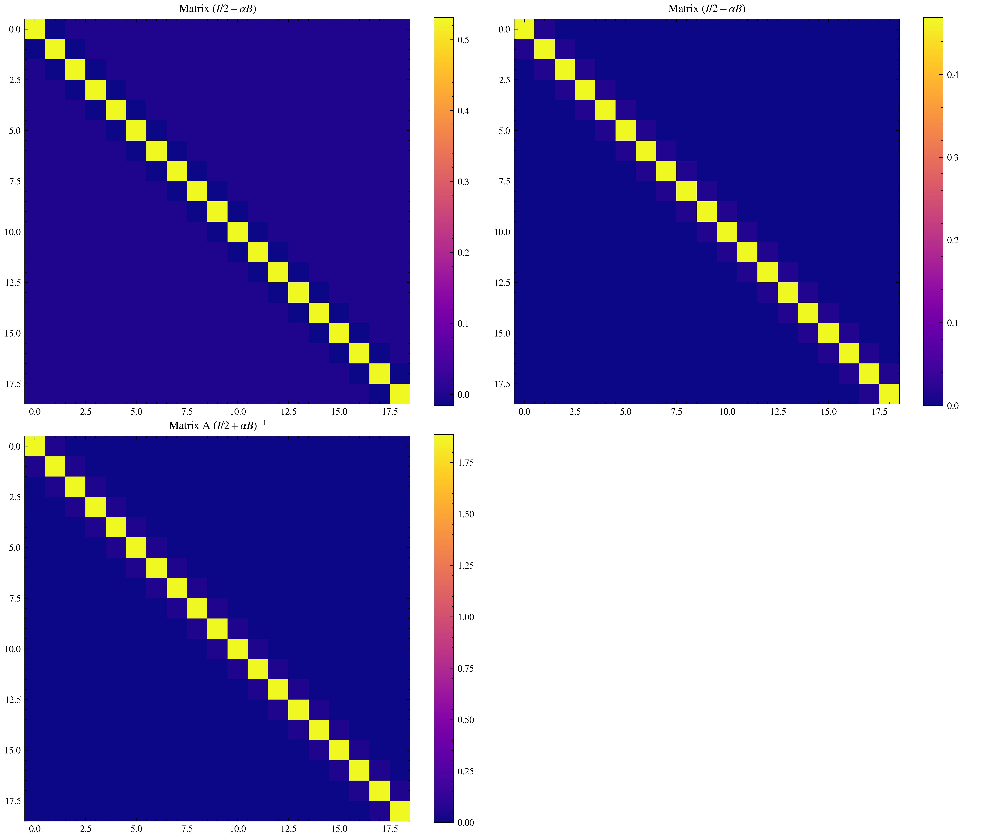

In [44]:
#  A and B
A = np.zeros((N-1, N-1))
B = np.zeros((N-1, N-1))
for i in range(N-1):
    A[i, i] = 1/2 + 2 * r
    B[i, i] = 1/2 - 2 * r
    if i < N-2:
        A[i, i+1] = -r
        A[i+1, i] = -r
        B[i, i+1] = r
        B[i+1, i] = r

# inverse of A
A_inv = np.linalg.inv(A)

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
im = axs[0, 0].imshow(A, cmap='plasma')
axs[0, 0].set_title(r'Matrix $(I/2 + \alpha B)$')
plt.colorbar(im, ax=axs[0, 0])
im = axs[0, 1].imshow(B, cmap='plasma')
axs[0, 1].set_title(r'Matrix $(I/2 - \alpha B)$')
plt.colorbar(im, ax=axs[0, 1])
im = axs[1, 0].imshow(A_inv, cmap='plasma')
axs[1, 0].set_title(r'Matrix A $(I/2 + \alpha B)^{-1}$')
plt.colorbar(im, ax=axs[1, 0])
axs[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [46]:
for j in range (1,time_steps+1):
    b[0]=r*u[0,j-1]+r*u[0,j]
    b[N-2]=r*u[N,j-1]+r*u[N,j]
    v=np.dot(B,u[1:(N),j-1])
    u[1:(N),j]=np.dot(A_inv,v+b)

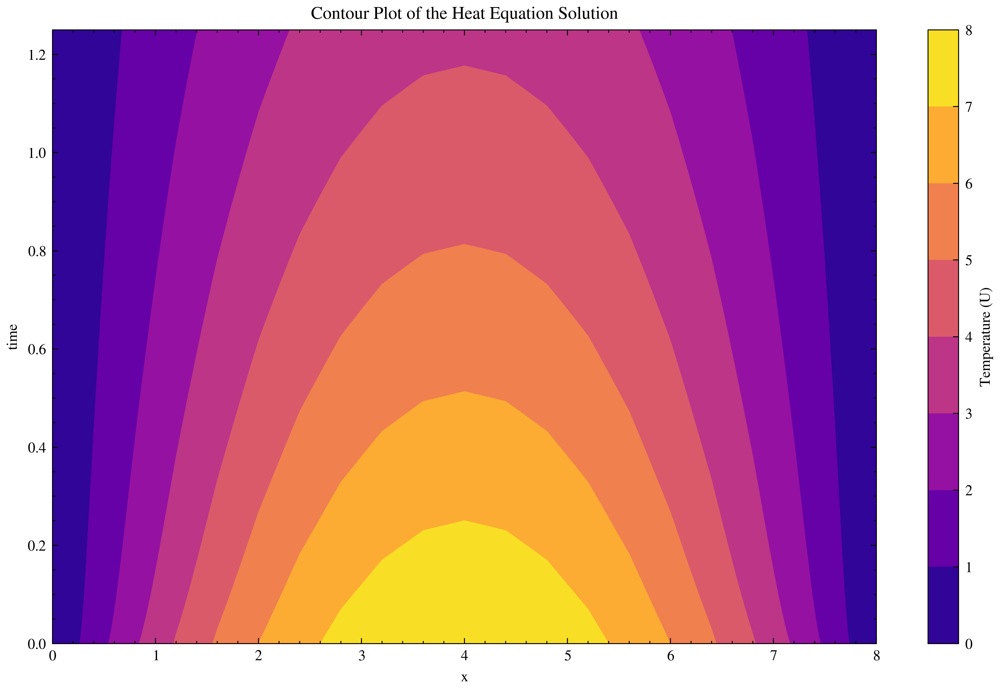

In [47]:
# Displaying solution in a contour plot
plt.figure(figsize=(10, 6))
plt.contourf(X, Y, u.transpose(), cmap='plasma')
plt.colorbar(label='Temperature (U)')
plt.xlabel('x')
plt.ylabel('time')
plt.title('Contour Plot of the Heat Equation Solution')
plt.show()

In [49]:
# Displaying solution in a table
print("Solution of the Heat Equation:")
table = tabulate(u, headers=[f't_{i}' for i in range(u.shape[1])], showindex=x.tolist(), tablefmt="grid")
print(table)

Solution of the Heat Equation:
+-----+-------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+----